# Example `Dysmalpy` 3D fitting, using fitting wrapper

**Includes the following components:**

 - Disk + Bulge
 - NFW halo
 - Constant velocity dispersion

:::{admonition} Note
The results of 3D fitting can greatly depend on how the 3D cube is masked. An automated 3D mask generation script is included in `DysmalPy` (as shown in the example here), but care should be taken in choosing appropriate parameters. Furthermore, it may be benefitial to hand-edit the mask to include/exclude spaxels or spectral regions.
:::

## Setup steps ##

**Import modules**

In [1]:
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

from dysmalpy.fitting_wrappers import dysmalpy_fit_single
from dysmalpy.fitting_wrappers import utils_io
from dysmalpy import fitting, plotting

import os

import numpy as np

**Setup notebook**

In [2]:
# Setup plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

mpl.rcParams['figure.dpi']= 300
mpl.rc("savefig", dpi=300)

from IPython.core.display import Image

**Set data, output paths**

_Note this will override the `datadir` and `outdir` specified in the param file._

_(This is useful for the example here. When running from command line, it's recommended to properly set the directories in the param file.)_

In [3]:
# Data directory
datadir = '/Users/sedona/data/dysmalpy_example_data/'
#'/YOUR/DATA/PATH/'

# Where to save output files
outdir = '/Users/sedona/data/dysmalpy_test_examples/JUPYTER_OUTPUT_3D_FITTING_WRAPPER/'
outdir_mpfit = outdir + 'MPFIT/'

param_filename = '/Users/sedona/data/dysmalpy_test_examples/fitting_3D_mpfit.params'

-------------------

In [4]:
plot_type = 'png'

--------

--------

## Examine results ##

**List all saved files in output directory:**

In [5]:
for f in os.listdir(outdir_mpfit): print(f)

GS4_43501_mpfit_bestfit_results_report.info
GS4_43501_LINE_bestfit_velprofile.dat
GS4_43501_mpfit_bestfit_OBS_extract_1D.png
GS4_43501_menc_tot_bary_dm.dat
GS4_43501_mpfit_results.pickle
GS4_43501_OBS_bestfit_cube.fits
GS4_43501_mpfit_bestfit_results.dat
GS4_43501_fit_report.txt
GS4_43501_fitting_3D_mpfit.params
GS4_43501_bestfit_menc.dat
GS4_43501_mpfit_bestfit_OBS_spaxels.png
GS4_43501_mpfit.log
GS4_43501_mpfit_bestfit_OBS_apertures.png
GS4_43501_OBS_out-cube.fits
GS4_43501_model.pickle
GS4_43501_vcirc_tot_bary_dm.dat
GS4_43501_mpfit_bestfit_OBS_extract_2D.png
GS4_43501_mpfit_bestfit_OBS_channels.png
GS4_43501_bestfit_vcirc.dat


### Result plots ###

**Read in parameter file**

In [6]:
params = utils_io.read_fitting_params(fname=param_filename)

# Override data + output paths:
params['datadir'] = datadir
params['outdir'] = outdir_mpfit

# Add the plot type:
params['plot_type'] = plot_type

f_galmodel = params['outdir'] + '{}_model.pickle'.format(params['galID'])
f_results =  params['outdir'] + '{}_{}_results.pickle'.format(params['galID'], 
                                                              params['fit_method'])

**Reload the galaxy, results files:**

In [7]:
gal, results = fitting.reload_all_fitting(filename_galmodel=f_galmodel, 
                                          filename_results=f_results, 
                                          fit_method=params['fit_method'])

**Plot the best-fit results:**

plot_model_multid: ndim=3: moment=False


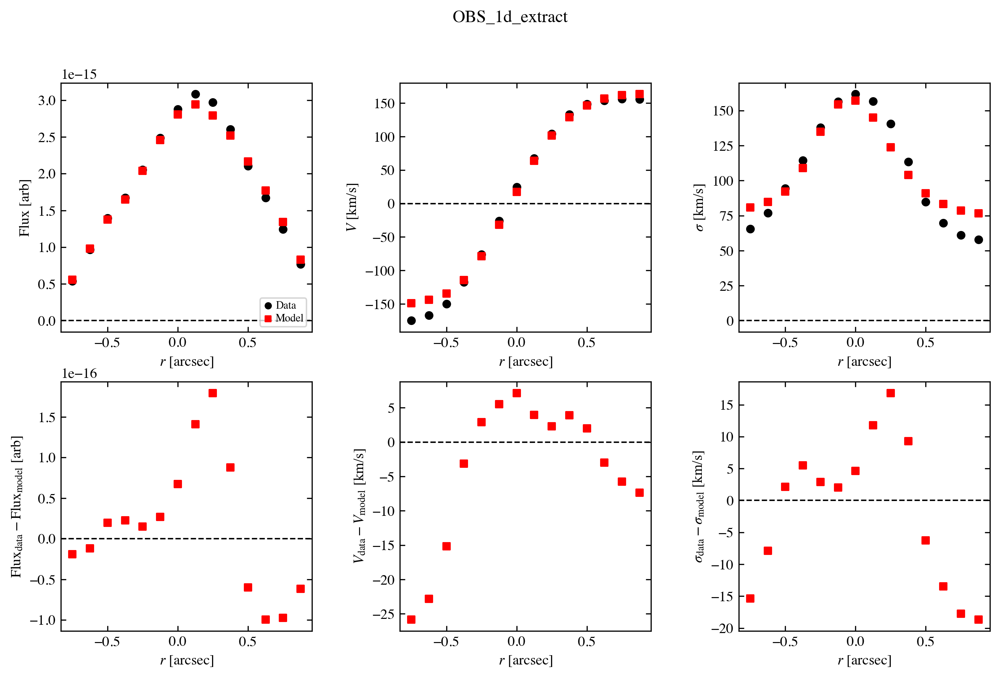

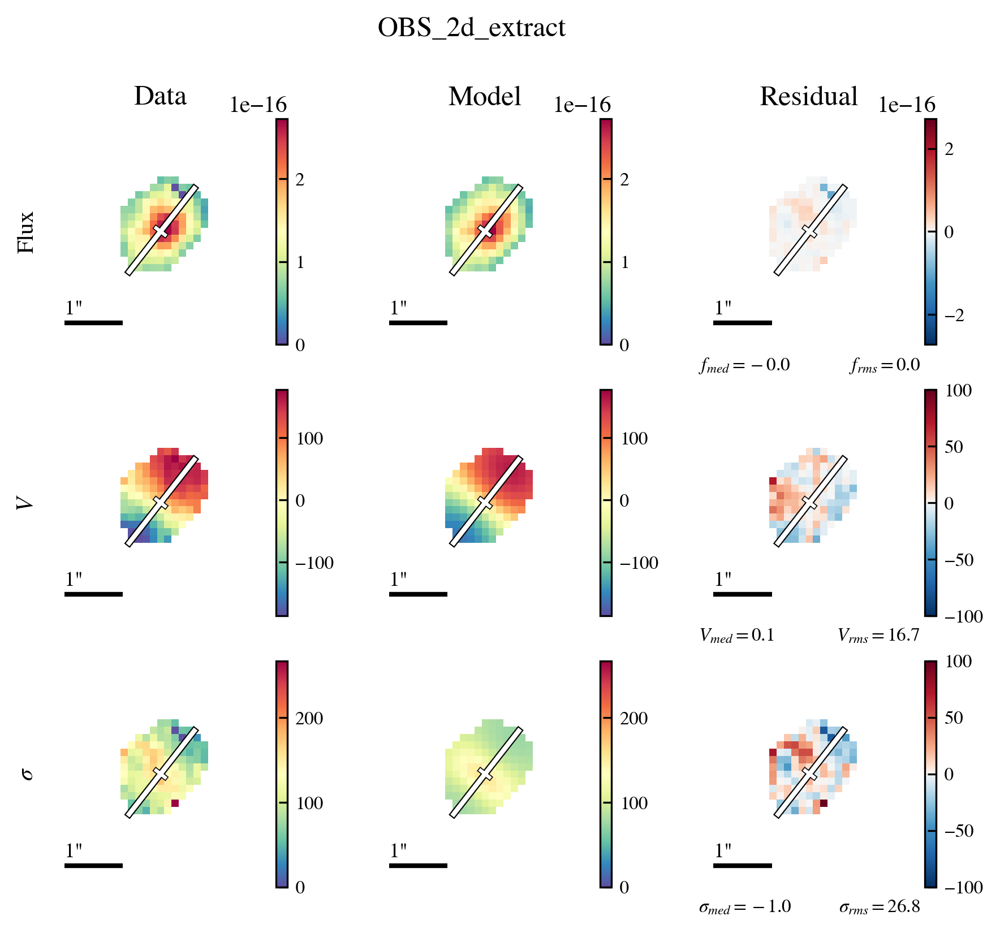

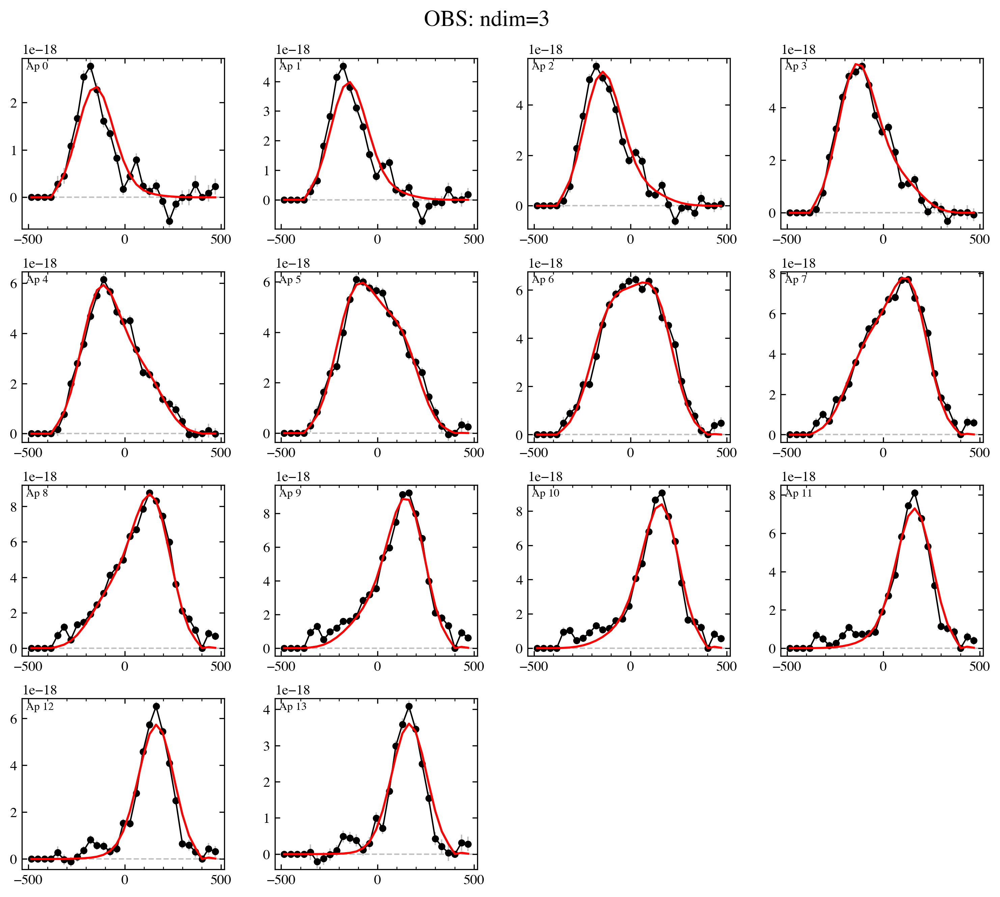

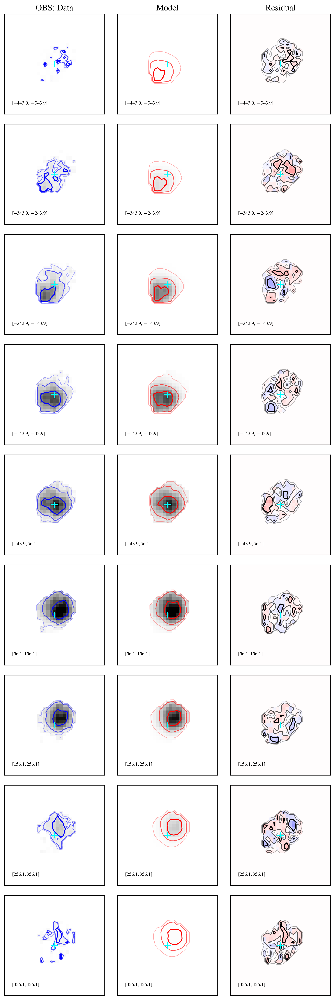

In [8]:
results.plot_results(gal)

--------

### Results reports ###

We now look at the results reports, which include the best-fit values and uncertainties (as well as other fitting settings and output).

In [9]:
# Print report
print(results.results_report(gal=gal))

###############################
 Fitting for GS4_43501

Date: 2022-05-29 18:38:31.913075

    obs: OBS
         Datafiles:
         n_wholepix_z_min:      3
         oversample:            1
         oversize:              1


Fitting method: MPFIT
    fit status: 1

pressure_support:      True
pressure_support_type: 1

###############################
 Fitting results
-----------
 disk+bulge
    total_mass         10.7773  +/-   0.0363
    r_eff_disk          2.7736  +/-   0.1372
    bt                  0.1191  +/-   0.0340

    n_disk              1.0000  [FIXED]
    r_eff_bulge         1.0000  [FIXED]
    n_bulge             4.0000  [FIXED]
    mass_to_light       1.0000  [FIXED]
-----------
 halo
    fdm                 0.2335  +/-   0.0416

    mvirial            12.4715  [TIED]
    conc                5.0000  [FIXED]
-----------
 dispprof_LINE
    sigma0             67.7036  +/-   1.5872
-----------
 zheightgaus
    sigmaz              0.4711  [TIED]
-----------
 geom_1
    vel_sh

**To <span style="color:DarkCyan">directly save</span> the results report** to a file, we can use the following:

In [10]:
# Save report to file:
f_report = params['outdir'] + '{}_fit_report.txt'.format(params['galID'])
results.results_report(gal=gal, filename=f_report)

**Also note the fitting wrappers automatically save two versions of the report files:**

In [11]:
fbase = '{}_{}_bestfit_results'.format(params['galID'], params['fit_method'])
f_report_pretty =  params['outdir'] + fbase + '_report.info'
f_report_machine = params['outdir'] + fbase + '.dat'

The "pretty" version, automatically saved as `*_best_fit_results_report.info`, is formatted to be human-readable, and includes more information on the fit settings at the beginning (for reference).

In [12]:
with open(f_report_pretty, 'r') as f:
    lines = [line.rstrip() for line in f]
    for line in lines: print(line)

###############################
 Fitting for GS4_43501

Date: 2022-05-29 17:56:45.522257

    obs: OBS
         Datafiles:
         n_wholepix_z_min:      3
         oversample:            1
         oversize:              1


Fitting method: MPFIT
    fit status: 1

pressure_support:      True
pressure_support_type: 1

###############################
 Fitting results
-----------
 disk+bulge
    total_mass         10.7773  +/-   0.0363
    r_eff_disk          2.7736  +/-   0.1372
    bt                  0.1191  +/-   0.0340

    n_disk              1.0000  [FIXED]
    r_eff_bulge         1.0000  [FIXED]
    n_bulge             4.0000  [FIXED]
    mass_to_light       1.0000  [FIXED]
-----------
 halo
    fdm                 0.2335  +/-   0.0416

    mvirial            12.4715  [TIED]
    conc                5.0000  [FIXED]
-----------
 dispprof_LINE
    sigma0             67.7036  +/-   1.5872
-----------
 zheightgaus
    sigmaz              0.4711  [TIED]
-----------
 geom_1
    vel_sh

The "machine" version, automatically saved as `*_best_fit_results.dat`, is formatted as a machine-readable space-separated ascii file. It includes key parameter fit information, as well as the best-fit reduced chisq.

In [13]:
with open(f_report_machine, 'r') as f:
    lines = [line.rstrip() for line in f]
    for line in lines: print(line)

# component             param_name      fixed       best_value   l68_err     u68_err
disk+bulge              total_mass      False        10.7773      0.0363      0.0363
disk+bulge              r_eff_disk      False         2.7736      0.1372      0.1372
disk+bulge              n_disk          True          1.0000    -99.0000    -99.0000
disk+bulge              r_eff_bulge     True          1.0000    -99.0000    -99.0000
disk+bulge              n_bulge         True          4.0000    -99.0000    -99.0000
disk+bulge              bt              False         0.1191      0.0340      0.0340
disk+bulge              mass_to_light   True          1.0000    -99.0000    -99.0000
halo                    mvirial         TIED         12.4715    -99.0000    -99.0000
halo                    fdm             False         0.2335      0.0416      0.0416
halo                    conc            True          5.0000    -99.0000    -99.0000
dispprof_LINE           sigma0          False        67.7036    -